In [1]:
# ! pip install spacy
# ! pip install -U gensim
# ! python -m spacy download en_core_web_sm
# ! pip install textblob

In [3]:
import pandas as pd
pd.set_option('display.max_columns', None)
from pandas.api.types import is_string_dtype, is_numeric_dtype,is_object_dtype
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import gridspec
from matplotlib.pyplot import *
import seaborn as sns

In [5]:
from sklearn import tree
from sklearn.metrics import accuracy_score,auc,make_scorer,confusion_matrix
from sklearn.metrics import f1_score,precision_score,recall_score,roc_curve
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [7]:
import pyLDAvis
import pyLDAvis.gensim

from itertools import chain
from collections import Counter
import scipy as sp

import scipy.stats as ss
import random

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

C:\Users\chaitanya\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backends is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
C:\Users\chaitanya\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import pos_tag

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\chaitanya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\chaitanya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\chaitanya\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\chaitanya\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [11]:
import spacy
from textblob import TextBlob
from wordcloud import WordCloud, STOPWORDS
import gensim
import gensim.corpora as corpora
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel
from gensim.models import Word2Vec
from scipy.spatial.distance import cdist

### Load dataset

In [13]:
import os
dataset = pd.read_csv("Hotel_Reviews.csv")
print(dataset.shape)

(515738, 17)


## 1.1 EDA

In [15]:
#vemos el dataset
dataset.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [17]:
duplicated = dataset.duplicated().sum()
print(f'El dataset tiene {duplicated} filas duplicadas.')

El dataset tiene 526 filas duplicadas.


In [19]:
df = dataset.drop_duplicates()
df.shape

(515212, 17)

In [21]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
Index: 515212 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515212 non-null  object 
 1   Additional_Number_of_Scoring                515212 non-null  int64  
 2   Review_Date                                 515212 non-null  object 
 3   Average_Score                               515212 non-null  float64
 4   Hotel_Name                                  515212 non-null  object 
 5   Reviewer_Nationality                        515212 non-null  object 
 6   Negative_Review                             515212 non-null  object 
 7   Review_Total_Negative_Word_Counts           515212 non-null  int64  
 8   Total_Number_of_Reviews                     515212 non-null  int64  
 9   Positive_Review                             515212 non-null  object 
 10  R

Hay 9 variables numericas y 8 categoricas. Review_Date y days_since_review no deben ser categoricas. 

In [7]:
df.describe()

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng
count,515212.000000,515212.000000,515212.000000,515212.000000,515212.000000,515212.000000,515212.000000,511944.000000,511944.000000
mean,498.416021,8.397767,18.540822,2744.698889,17.778256,7.164895,8.395532,49.443040,2.824222
std,500.668595,0.547952,29.693991,2318.090821,21.804541,11.039354,1.637467,3.468029,4.581637
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.000000,2.500000,41.328376,-0.369758
25%,169.000000,8.100000,2.000000,1161.000000,5.000000,1.000000,7.500000,48.214277,-0.143649
50%,342.000000,8.400000,9.000000,2134.000000,11.000000,3.000000,8.800000,51.499981,-0.000250
75%,660.000000,8.800000,23.000000,3633.000000,22.000000,8.000000,9.600000,51.516288,4.834443
max,2682.000000,9.800000,408.000000,16670.000000,395.000000,355.000000,10.000000,52.400181,16.429233


In [8]:
df.isna().sum().sort_values(ascending=False)

lng                                           3268
lat                                           3268
Negative_Review                                997
Reviewer_Nationality                           522
Positive_Review                                193
Review_Total_Positive_Word_Counts                0
days_since_review                                0
Tags                                             0
Reviewer_Score                                   0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Total_Negative_Word_Counts                0
Hotel_Name                                       0
Average_Score                                    0
Review_Date                                      0
Total_Number_of_Reviews                          0
dtype: int64

In [9]:
for column in df:
    if is_object_dtype(df[column]):
        print(column,len(df[column].unique()))

Hotel_Address 1493
Review_Date 731
Hotel_Name 1492
Reviewer_Nationality 227
Negative_Review 330010
Positive_Review 412600
Tags 55242
days_since_review 731


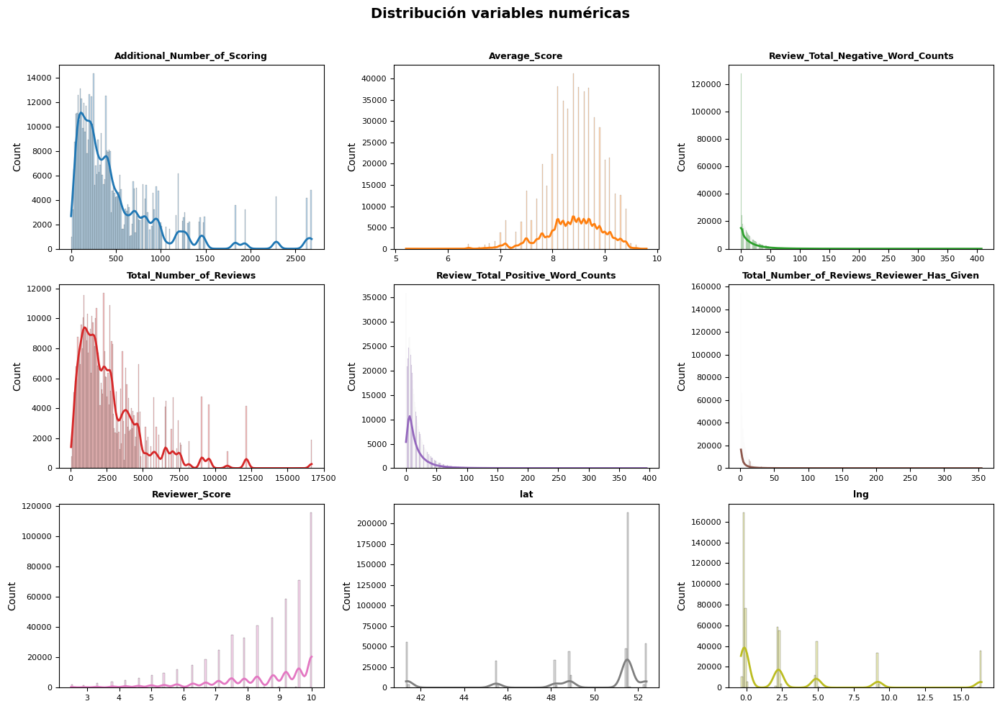

In [23]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(14, 10))
axes = axes.flat
columnas_numeric = df.select_dtypes(include=['float64', 'int64']).columns

for i, colum in enumerate(columnas_numeric):
    sns.histplot(
        data    = df,
        x       = colum,
        stat    = "count",
        kde     = True,
        color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
        line_kws= {'linewidth': 2},
        alpha   = 0.3,
        ax      = axes[i]
    )
    axes[i].set_title(colum, fontsize = 9, fontweight = "bold")
    axes[i].tick_params(labelsize = 8)
    axes[i].set_xlabel("")
    
    
fig.tight_layout()
plt.subplots_adjust(top = 0.9)
fig.suptitle('Distribución variables numéricas', fontsize = 14, fontweight = "bold");

### Outliers

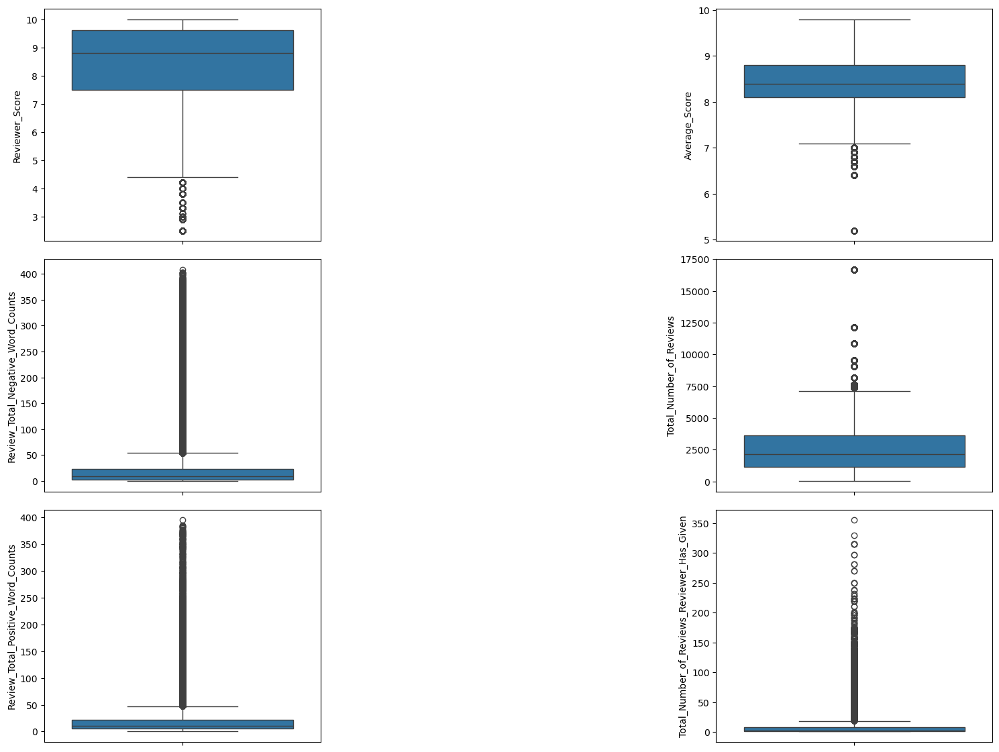

In [25]:
columnas = ['Reviewer_Score', 'Average_Score', 'Review_Total_Negative_Word_Counts', 'Total_Number_of_Reviews', 
           'Review_Total_Positive_Word_Counts', 'Total_Number_of_Reviews_Reviewer_Has_Given']
n = 1
plt.figure(figsize=(20,15))

for column in columnas:
  plt.subplot(4,4,n)
  n = n+2
  sns.boxplot(df[column])
  plt.tight_layout()

## 1.2 PRE-PROCESSING

In [27]:

df['month'] = pd.to_datetime(df['Review_Date']).dt.month.apply(str)
df['year'] = pd.to_datetime(df['Review_Date']).dt.year.apply(str)
df['day'] = pd.to_datetime(df['Review_Date']).dt.day.apply(str)

df['month'] = pd.to_datetime(df['Review_Date']).dt.month_name() # no se compila con  locale="English"

df['period'] = pd.to_datetime(df['Review_Date']).dt.strftime('%m/%Y') # => 7/
df['period'] = pd.to_datetime(df['period'])

In [29]:
random = np.random.choice(df['Reviewer_Nationality'])
df['Reviewer_Nationality'] = df['Reviewer_Nationality'].fillna(random)

df['Negative_Review'] = df['Negative_Review'].fillna('No Negative')
df['Positive_Review'] = df['Positive_Review'].fillna('No Positive')

df[['Reviewer_Nationality','Negative_Review','Positive_Review']].isnull().any().any()

False

In [31]:
df.insert(7,'Negative_Word_Counts',df['Negative_Review'].str.split().str.len())
df.insert(11,'Positive_Word_Counts',df['Positive_Review'].str.split().str.len())

df.loc[df.Positive_Review == 'No Positive', ['Positive_Word_Counts']] = 0
df.loc[df.Negative_Review == 'No Negative', ['Negative_Word_Counts']] = 0

df.Reviewer_Nationality = df.Reviewer_Nationality.str.rstrip()

def country_ident(st):
    last = st.split()[-1]
    if last == "Kingdom": return "United Kingdom"
    else: 
        return last
    
df["Hotel_Country"] = df["Hotel_Address"].apply(country_ident)

In [35]:
df.drop(['Review_Date','Review_Total_Positive_Word_Counts', 'Review_Total_Negative_Word_Counts', 'Additional_Number_of_Scoring'],axis=1, inplace=True)

KeyError: "['Review_Date', 'Review_Total_Positive_Word_Counts', 'Review_Total_Negative_Word_Counts', 'Additional_Number_of_Scoring'] not found in axis"

In [16]:
df.head()

,Hotel_Address,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,month,year,day,period,Hotel_Country
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,7.7,Hotel Arena,Russia,I am so angry that i made this post available ...,395,1403,Only the park outside of the hotel was beautiful,9,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,August,2017,3,2017-08-01,Netherlands
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great l...,103,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968,August,2017,3,2017-08-01,Netherlands
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficult...,40,1403,Location was good and staff were ok It is cute...,19,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968,July,2017,31,2017-07-01,Netherlands
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk bar...,208,1403,Great location in nice surroundings the bar an...,24,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968,July,2017,31,2017-07-01,Netherlands
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,7.7,Hotel Arena,New Zealand,You When I booked with your company on line yo...,138,1403,Amazing location and building Romantic setting,6,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968,July,2017,24,2017-07-01,Netherlands


## 1.3 VISUALIZATION

In [37]:
labelencoder = LabelEncoder()
df2 = df
# Assigning numerical values and storing in another column
df2['Reviewer_Nationality_cat'] = labelencoder.fit_transform(df2['Reviewer_Nationality'])
print("Correlacion entre Nacionalidad y puntuacion:",df2.Reviewer_Nationality_cat.corr(df2.Reviewer_Score))

Correlacion entre Nacionalidad y puntuacion: 0.03480159002068762


In [39]:
nationality_data = pd.DataFrame(df["Reviewer_Nationality"].value_counts())
nationality_data.rename(columns={"Reviewer_Nationality": "Numero_huespedes"}, inplace=True)
total_guests = nationality_data["Numero_huespedes"].sum()
nationality_data["Huespedes en %"] = round(nationality_data["Numero_huespedes"] / total_guests * 100, 2)
nationality_data["pais"] = nationality_data.index
#nationality_data["pais_otros"] = nationality_data.index
nationality_data['media_puntaje'] = df.groupby(["Reviewer_Nationality"]).Reviewer_Score.mean()
nationality_data.loc[nationality_data["Huespedes en %"] < 1, "pais"] = "Other"


fig = px.pie(nationality_data,
             values="Numero_huespedes",
             names="pais",
             title="Pais de orígen de huéspedes",
             template="seaborn")
fig.update_traces(textposition="inside", textinfo="percent+label")
fig.show()

KeyError: 'Numero_huespedes'

60% de reseñas estan hechas solo por 4 paises de habla ingles. 

In [19]:
nationality_data

,Numero_huespedes,Huespedes en %,pais,media_puntaje
United Kingdom,245632,47.68,United Kingdom,8.485527
United States of America,35349,6.86,United States of America,8.786927
Australia,21648,4.20,Australia,8.592507
Ireland,14814,2.88,Ireland,8.463953
United Arab Emirates,10229,1.99,United Arab Emirates,7.879695
...,...,...,...,...
Cape Verde,1,0.00,Other,9.600000
Northern Mariana Islands,1,0.00,Other,5.800000
Tuvalu,1,0.00,Other,7.100000
Guinea,1,0.00,Other,7.500000


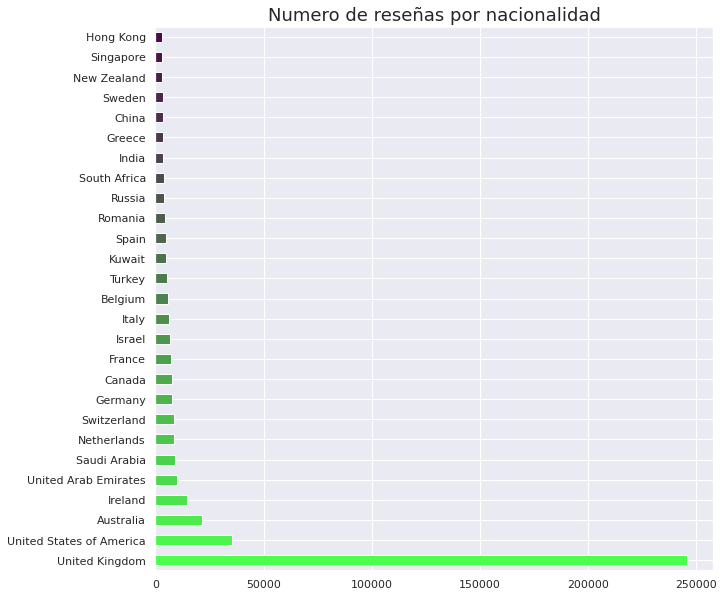

In [20]:
reviews_count=nationality_data[nationality_data["Numero_huespedes"]>3000]["Numero_huespedes"].sort_values(ascending = False)

colors = []
dim = reviews_count.shape[0]
for i in range(dim):
    r = i * 1/dim
    colors.append((0.3,1-r,0.3))

reviews_count.plot.barh(figsize=(10,10), color = colors)
plt.title("Numero de reseñas por nacionalidad", fontsize = 18)
plt.ylabel("")

plt.show()

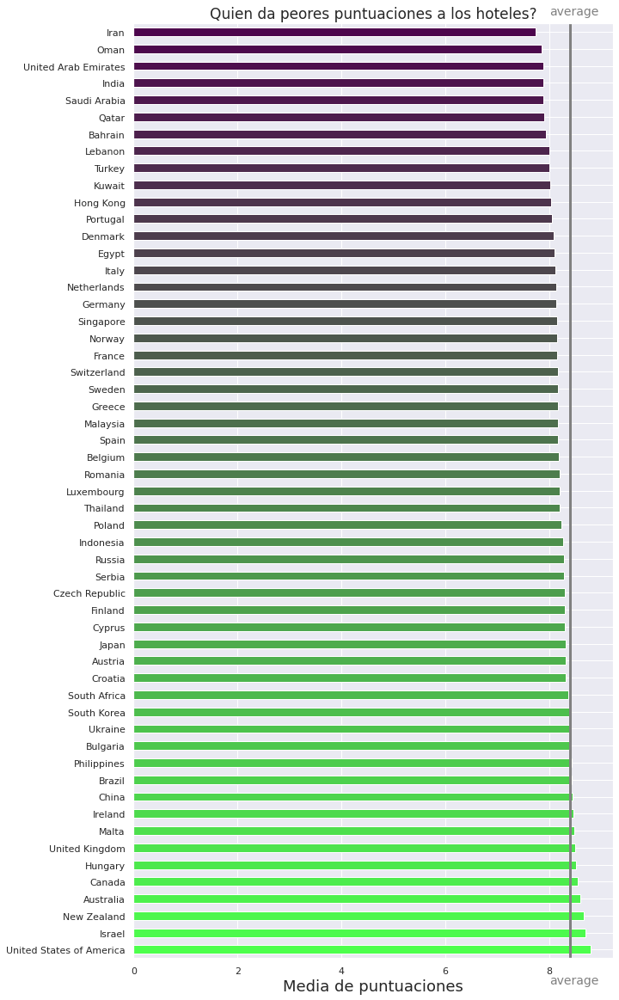

In [21]:
nationality_data2 = nationality_data[nationality_data["Numero_huespedes"] > 1000].sort_values(by = "media_puntaje", ascending = False)

colors = []
dim = nationality_data2.shape[0]
for i in range(dim):
    r = i * 1/dim
    colors.append((0.3,1-r,0.3))

nationality_data2["media_puntaje"].plot.barh(figsize = (10,20), color = colors)
plt.title("Quien da peores puntuaciones a los hoteles?", fontsize = 17)
plt.axvline(df["Reviewer_Score"].mean(), 0 ,1, color = "grey", lw = 3)
plt.text(8, 55, "average", fontsize = 14, c = "grey")
plt.text(8, -2, "average", fontsize = 14, c = "grey")
plt.xlabel("Media de puntuaciones", fontsize = 18)
plt.ylabel("")
plt.show()

In [22]:
df[df.Average_Score >= 8.8][['Hotel_Name','Average_Score','Total_Number_of_Reviews']].drop_duplicates().sort_values(by ='Total_Number_of_Reviews',ascending = False)[:10]


,Hotel_Name,Average_Score,Total_Number_of_Reviews
404728,Glam Milano,8.8,7371
309843,Jaz Amsterdam,8.9,7108
327773,Ayre Hotel Gran V a,8.8,4887
57597,M by Montcalm Shoreditch London Tech City,9.1,4802
450210,Hotel Esther a,9.1,4687
180550,citizenM Tower of London,9.1,4672
370315,25hours Hotel beim MuseumsQuartier,8.8,4324
361190,Hilton London Wembley,8.8,4305
14829,Intercontinental London The O2,9.4,4204
470003,The Square Milano Duomo,9.0,4192


In [23]:
best_hotels = pd.DataFrame(df.groupby(['Hotel_Name', 'Hotel_Country','Average_Score'])['Average_Score'].mean().sort_values(ascending=False).head(10))
worst_hotels = pd.DataFrame(df.groupby(['Hotel_Name', 'Hotel_Country', 'Average_Score'])['Average_Score'].mean().sort_values(ascending=False).tail(10))

best_worst_hotels = best_hotels +worst_hotels
best_worst_hotels.drop(best_worst_hotels.columns[len(best_worst_hotels.columns)-1], axis=1, inplace=True)
best_worst_hotels.sort_values(by="Average_Score")

,,
Hotel_Name,Hotel_Country,Average_Score
Hotel Liberty,Italy,5.2
Savoy Hotel Amsterdam,Netherlands,6.4
Hotel Cavendish,United Kingdom,6.4
Best Western Maitrise Hotel Edgware Road,United Kingdom,6.6
The Tophams Hotel,United Kingdom,6.6
Commodore Hotel,United Kingdom,6.7
Ibis Styles Milano Palmanova,Italy,6.7
Villa Eugenie,France,6.8
Bloomsbury Palace Hotel,United Kingdom,6.8


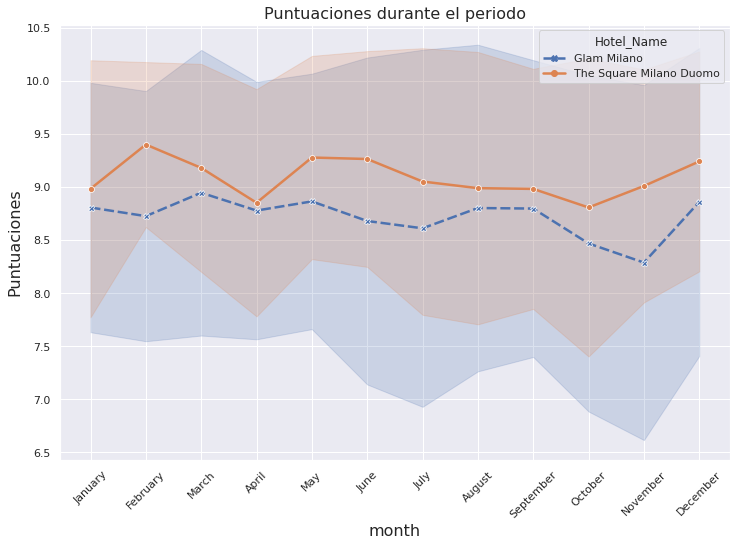

In [24]:
puntuaciones_hotel = df[["Hotel_Name", "month", "Reviewer_Score"]].sort_values("month")
filter_list = ['Glam Milano', 'The Square Milano Duomo']
puntuaciones_hotel = puntuaciones_hotel[(puntuaciones_hotel.Hotel_Name.isin(filter_list))] 

meses = ["January", "February", "March", "April", "May", "June", 
          "July", "August", "September", "October", "November", "December"]
puntuaciones_hotel["month"] = pd.Categorical(puntuaciones_hotel["month"], categories=meses, ordered=True)
                                         
plt.figure(figsize=(12, 8))
sns.lineplot(x = "month", y="Reviewer_Score", hue="Hotel_Name", data=puntuaciones_hotel, 
             hue_order = ['Glam Milano', 'The Square Milano Duomo'],
             ci="sd", size="Hotel_Name", sizes=(2.5, 2.5), style = "Hotel_Name",markers=True)
plt.title("Puntuaciones durante el periodo", fontsize=16)
plt.xlabel("month", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Puntuaciones", fontsize=16)
plt.show()

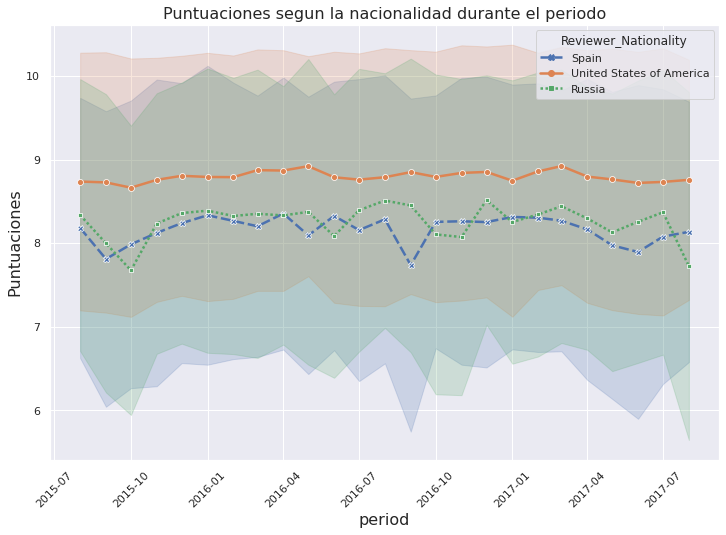

In [25]:
puntuaciones_hotel = df[["Reviewer_Nationality", "period", "Reviewer_Score"]].sort_values("period")
filter_list = ['Spain', 'United States of America', 'Russia']
puntuaciones_hotel = puntuaciones_hotel[(puntuaciones_hotel.Reviewer_Nationality.isin(filter_list))] 
                                         
plt.figure(figsize=(12, 8))
sns.lineplot(x = "period", y="Reviewer_Score", hue="Reviewer_Nationality", data=puntuaciones_hotel, 
             hue_order = ['Spain', 'United States of America', 'Russia'],
             ci="sd", size="Reviewer_Nationality", sizes=(2.5, 2.5), style = "Reviewer_Nationality",markers=True)
plt.title("Puntuaciones segun la nacionalidad durante el periodo", fontsize=16)
plt.xlabel("period", fontsize=16)
plt.xticks(rotation=45)
plt.ylabel("Puntuaciones", fontsize=16)
plt.show()

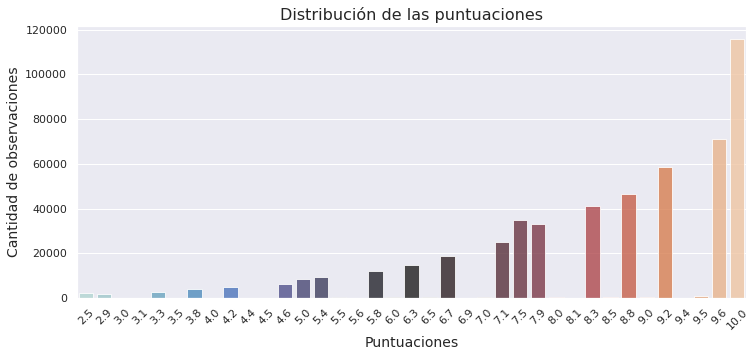

In [26]:
x=df['Reviewer_Score'].value_counts()
x=x.sort_index()
#plot
plt.figure(figsize=(12,5))
ax= sns.barplot(x.index, x.values, alpha=0.8, palette="icefire")
plt.title("Distribución de las puntuaciones", fontsize=16)
plt.ylabel('Cantidad de observaciones', fontsize=14)
plt.xlabel('Puntuaciones', fontsize=14)
plt.xticks(rotation=45)

#adding the text labels
#rects = ax.patches
#labels = x.values
#for rect, label in zip(rects, labels):
    #height = rect.get_height()
    #ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom',rotation='vertical')
plt.show()

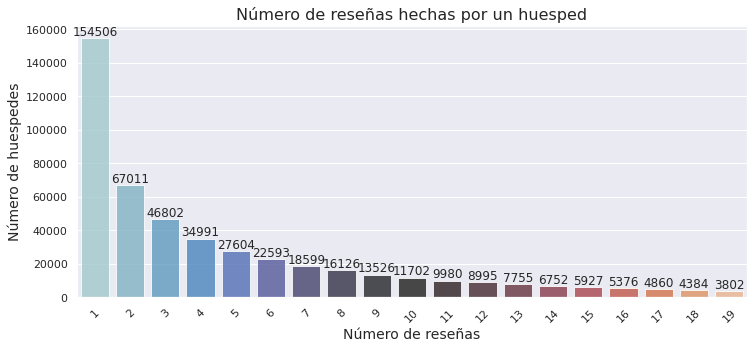

In [27]:
x=df[df.Total_Number_of_Reviews_Reviewer_Has_Given <20]['Total_Number_of_Reviews_Reviewer_Has_Given'].value_counts()
x=x.sort_index()

#plot
plt.figure(figsize=(12,5))
ax= sns.barplot(x.index, x.values, alpha=0.8, palette="icefire")
plt.title("Número de reseñas hechas por un huesped",  fontsize=16)
plt.ylabel('Número de huespedes', fontsize=14)
plt.xlabel('Número de reseñas', fontsize=14)
plt.xticks(rotation=45)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show()

In [28]:
df.groupby(["Hotel_Name"]).Reviewer_Score.agg([max,min])

,max,min
Hotel_Name,,
11 Cadogan Gardens,10.0,4.2
1K Hotel,10.0,3.8
25hours Hotel beim MuseumsQuartier,10.0,2.5
41,10.0,6.7
45 Park Lane Dorchester Collection,10.0,8.3
...,...,...
citizenM London Bankside,10.0,2.9
citizenM London Shoreditch,10.0,2.5
citizenM Tower of London,10.0,3.0


In [29]:
df.groupby(["Hotel_Name",'Reviewer_Nationality']).Reviewer_Nationality.count()

Hotel_Name          Reviewer_Nationality    
11 Cadogan Gardens  Australia                    5
                    Austria                      1
                    Belgium                      2
                    Bermuda                      1
                    Brazil                       1
                                                ..
pentahotel Vienna   Turkey                       1
                    Ukraine                      3
                    United Arab Emirates         4
                    United Kingdom              19
                    United States of America     3
Name: Reviewer_Nationality, Length: 64770, dtype: int64

In [30]:
df.groupby(["Hotel_Name",'Reviewer_Nationality']).Reviewer_Score.min().head()

Hotel_Name          Reviewer_Nationality
11 Cadogan Gardens  Australia                7.1
                    Austria                 10.0
                    Belgium                  8.3
                    Bermuda                  9.6
                    Brazil                   9.6
Name: Reviewer_Score, dtype: float64

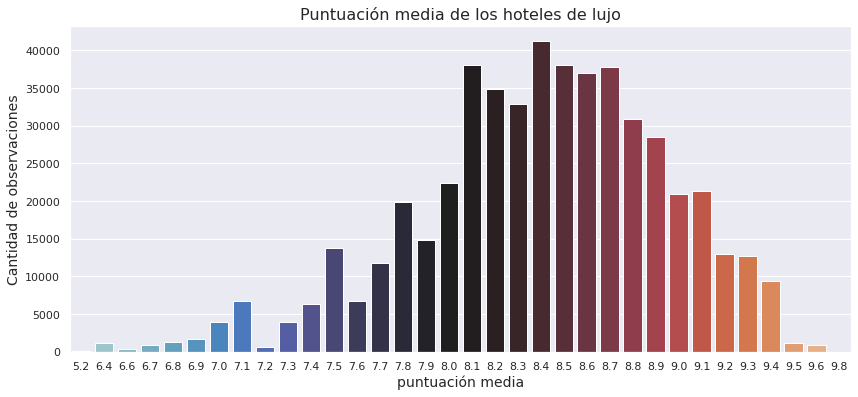

In [31]:
plt.figure(figsize = (14,6))
sns.countplot(x = df['Average_Score'],data = df, palette="icefire")

plt.title("Puntuación media de los hoteles de lujo",  fontsize=16)
plt.ylabel('Cantidad de observaciones', fontsize=14)
plt.xlabel('puntuación media', fontsize=14)
plt.show()

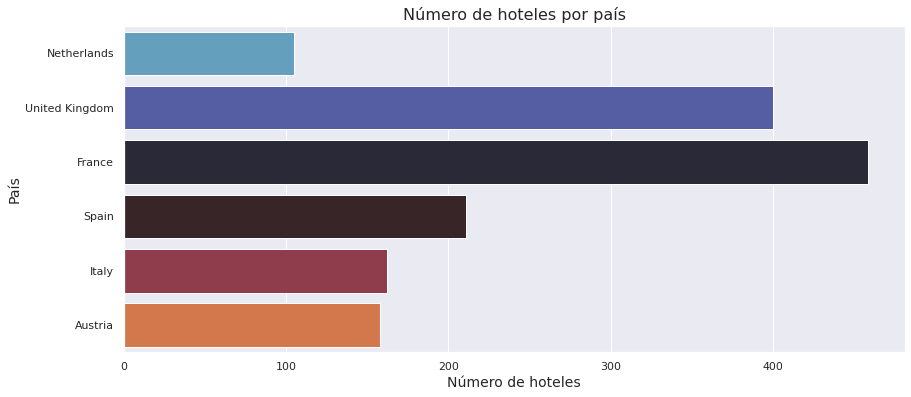

In [32]:
hotels_country = df[['Hotel_Country',"Hotel_Name"]].drop_duplicates()

plt.figure(figsize = (14,6))
sns.countplot(y = hotels_country['Hotel_Country'],data = hotels_country, palette="icefire")

plt.title("Número de hoteles por país",  fontsize=16)
plt.ylabel('País', fontsize=14)
plt.xlabel('Número de hoteles', fontsize=14)
      
plt.show()


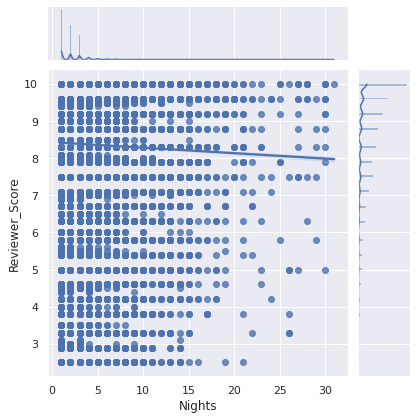

In [33]:
def splitString(string):
    array = string.split(" ', ' ")
    array[0] = array[0][3:]
    array[-1] = array[-1][:-3]
    if not 'trip' in array[0]:
        array.insert(0,None)
    try:
        return float(array[3].split()[1])
    except:
        return None

df["Nights"] = df["Tags"].apply(splitString)

sns.jointplot(data=df,y="Reviewer_Score",x="Nights",kind="reg")



In [34]:
df['Leisure'] = df['Tags'].map(lambda x: 1 if ' Leisure trip ' in x else 0)
df['Business'] = df['Tags'].map(lambda x: 2 if ' Business trip ' in x else 0)
df['Trip_type'] = df['Leisure'] + df['Business']

In [35]:
df.Trip_type.value_counts()

1    417355
2     82853
0     15004
Name: Trip_type, dtype: int64

In [36]:
df[df.Business == 2].groupby(["Hotel_Name", "Hotel_Country"]).Reviewer_Score.mean().sort_values(ascending=False).head(10)

Hotel_Name                                Hotel_Country 
Hotel Dupond Smith                        France            10.000000
Splendide Royal Paris                     France            10.000000
Goralska R sidences H tel Paris Bastille  France            10.000000
W Paris Op ra                             France            10.000000
Hotel J ger                               Austria            9.866667
Ritz Paris                                France             9.866667
Maison Souquet                            France             9.840000
Bulgari Hotel London                      United Kingdom     9.800000
Hotel The Serras                          Spain              9.800000
41                                        United Kingdom     9.777778
Name: Reviewer_Score, dtype: float64

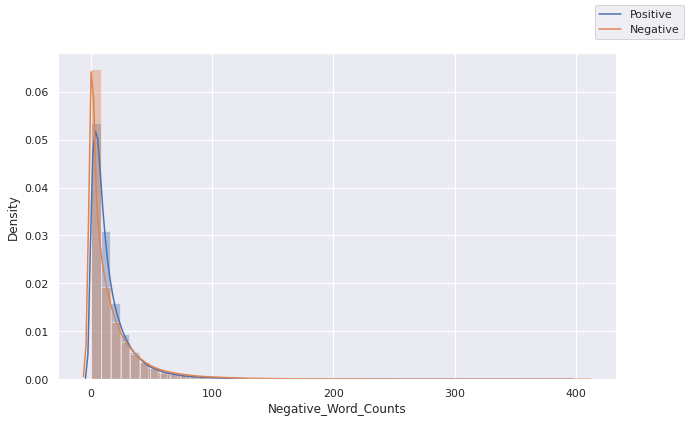

In [37]:
fig = plt.figure(figsize=(10,6))
plt1 = sns.distplot(df["Positive_Word_Counts"], hist=True, label="Positive")
plt2 = sns.distplot(df["Negative_Word_Counts"], hist=True, label="Negative")
fig.legend(labels=['Positive','Negative'])
plt.show()

# Part 2: Data Models

In [38]:
df['all_reviews']=df['Negative_Review']+ ' ' + df['Positive_Review']

df['all_reviews'].isnull().any().any()

False

In [39]:
df["positive"] = df["Reviewer_Score"].apply(lambda x: 1 if x >= 6 else 0)
df_reviews = df[["all_reviews","positive", "Reviewer_Score", "Hotel_Name"]]
df_reviews

,all_reviews,positive,Reviewer_Score,Hotel_Name
0,I am so angry that i made this post available ...,0,2.9,Hotel Arena
1,No Negative No real complaints the hotel was g...,1,7.5,Hotel Arena
2,Rooms are nice but for elderly a bit difficult...,1,7.1,Hotel Arena
3,My room was dirty and I was afraid to walk bar...,0,3.8,Hotel Arena
4,You When I booked with your company on line yo...,1,6.7,Hotel Arena
...,...,...,...,...
515733,no trolly or staff to help you take the luggag...,1,7.0,Atlantis Hotel Vienna
515734,The hotel looks like 3 but surely not 4 Break...,0,5.8,Atlantis Hotel Vienna
515735,The ac was useless It was a hot week in vienna...,0,2.5,Atlantis Hotel Vienna
515736,No Negative The rooms are enormous and really ...,1,8.8,Atlantis Hotel Vienna


In [40]:
df_reviews["all_reviews"] = df_reviews["all_reviews"].apply(lambda x: x.replace("No Negative ", "").replace("No Positive ", ""))
print(df['all_reviews'].isnull().any().any())
df_reviews

False


,all_reviews,positive,Reviewer_Score,Hotel_Name
0,I am so angry that i made this post available ...,0,2.9,Hotel Arena
1,No real complaints the hotel was great great l...,1,7.5,Hotel Arena
2,Rooms are nice but for elderly a bit difficult...,1,7.1,Hotel Arena
3,My room was dirty and I was afraid to walk bar...,0,3.8,Hotel Arena
4,You When I booked with your company on line yo...,1,6.7,Hotel Arena
...,...,...,...,...
515733,no trolly or staff to help you take the luggag...,1,7.0,Atlantis Hotel Vienna
515734,The hotel looks like 3 but surely not 4 Break...,0,5.8,Atlantis Hotel Vienna
515735,The ac was useless It was a hot week in vienna...,0,2.5,Atlantis Hotel Vienna
515736,The rooms are enormous and really comfortable ...,1,8.8,Atlantis Hotel Vienna


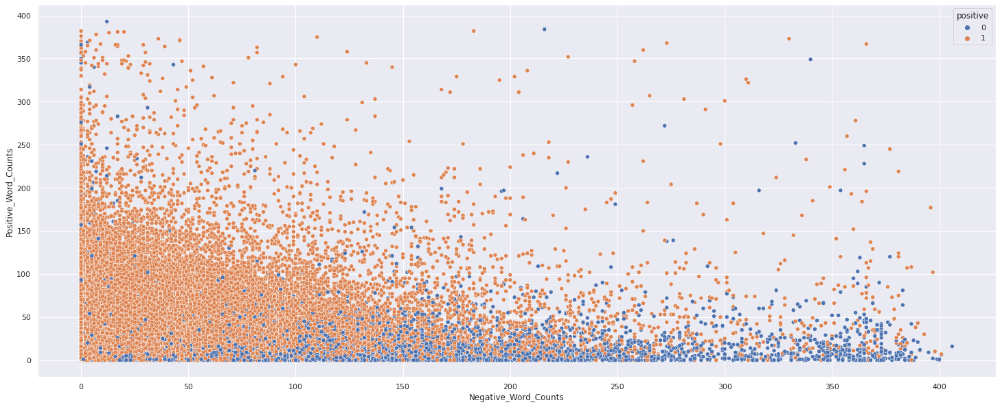

In [41]:
plt.figure(figsize=(25,10))
sns.scatterplot(x=df['Negative_Word_Counts'], y=df['Positive_Word_Counts'],hue=df['positive'])
plt.show()

In [42]:
a = pd.DataFrame(df.groupby(["Reviewer_Nationality","positive"]).positive.count())
a.rename(columns={"positive": "Cantidades"}, inplace=True)
a

Cantidades
Reviewer_Nationality positive            
Abkhazia Georgia     0                 15
                     1                138
Afghanistan          0                  3
                     1                  5
Albania              0                 41
...                                   ...
Yemen                1                 14
Zambia               0                  3
                     1                 34
Zimbabwe             0                  5
                     1                 46

[404 rows x 1 columns]

Class 1 - Positive: 462796
Class 0 - Negative: 52416
Proportion: 8.83 : 1


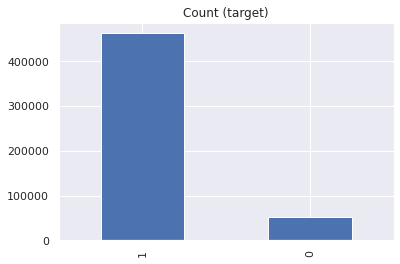

In [43]:
target_count = df_reviews.positive.value_counts()
print('Class 1 - Positive:', target_count[1])
print('Class 0 - Negative:', target_count[0])
print('Proportion:', round(target_count[1] / target_count[0], 2), ': 1')

target_count.plot(kind='bar', title='Count (target)');

El dataset es binario, no balanceado: hay 9 veces más las opiniones positivas que negativas.

![](https://raw.githubusercontent.com/rafjaa/machine_learning_fecib/master/src/static/img/resampling.png)

In [44]:
# Conteo de clases
class_0, class_1 = df_reviews.positive.value_counts()

# Dividimos en clases
df_class_0 = df_reviews[df_reviews['positive'] == 0]
df_class_1 = df_reviews[df_reviews['positive'] == 1]

# submuestreo aleatorio (random under-sampling)
df_class_1_under = df_class_1.sample(class_1,random_state=1)
df_sample = pd.concat([df_class_0, df_class_1_under], axis=0)

print('Submuestreo aleatorio:')
print(df_sample.positive.value_counts())


Submuestreo aleatorio:
0    52416
1    52416
Name: positive, dtype: int64


### 2.1.2 Normalization

In [45]:
def texto_to_lower(text):
  return text.lower()

def tokenizar(text):
  tokens = word_tokenize(text)
  return tokens

from nltk.corpus import stopwords
def quitar_stopwords(tokens):
    stop_words = set(stopwords.words('english')) 
    filtered_sentence = [w for w in tokens if not w in stop_words]
    return filtered_sentence

def quitar_puntuacion(tokens):
    words=[word for word in tokens if word.isalpha()]
    return words

def quitar_palabras_menos2letras(tokens):
    words=[word for word in tokens if len(word) >1]
    return words

import en_core_web_sm
nlp = en_core_web_sm.load(disable=['parser', 'ner'])
def lematizar(tokens):
    sentence = " ".join(tokens)
    mytokens = nlp(sentence)
    # Lematizamos los tokens y los convertimos  a minusculas
    mytokens = [ word.lemma_ if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    # Extraemos el text en una string
    return " ".join(mytokens)

In [46]:
df_sample["clean_reviews"] = df_sample["all_reviews"].progress_apply(lambda x: texto_to_lower(x))
# Tokenizar
df_sample["clean_reviews"] = df_sample["clean_reviews"].progress_apply(lambda x: tokenizar(x))
#  Stopwords
df_sample["clean_reviews"] = df_sample["clean_reviews"].progress_apply(lambda x: quitar_stopwords(x))
#  puntuación
df_sample["clean_reviews"] = df_sample["clean_reviews"].progress_apply(lambda x: quitar_puntuacion(x))
df_sample["clean_reviews"] = df_sample["clean_reviews"].progress_apply(lambda x: quitar_palabras_menos2letras(x))

  0%|          | 0/104832 [00:00<?, ?it/s]

  0%|          | 0/104832 [00:00<?, ?it/s]

  0%|          | 0/104832 [00:00<?, ?it/s]

  0%|          | 0/104832 [00:00<?, ?it/s]

  0%|          | 0/104832 [00:00<?, ?it/s]

In [47]:
print(df_sample["all_reviews"][11])

6 30 AM started big noise workers loading wood down the windows Stupid room numbering system it took 20 Minutes with a night guard finally to find our rooms The check in staff pointed us in the wrong direction No late dinner bar closes at 1 am Ugly view on trash lorry from windows No information about the computerized telephone Huge price difference between booking Com price 166 euros and hotel price 260  Style location rooms


In [48]:
print(df_sample["clean_reviews"][11])

['started', 'big', 'noise', 'workers', 'loading', 'wood', 'windows', 'stupid', 'room', 'numbering', 'system', 'took', 'minutes', 'night', 'guard', 'finally', 'find', 'rooms', 'check', 'staff', 'pointed', 'us', 'wrong', 'direction', 'late', 'dinner', 'bar', 'closes', 'ugly', 'view', 'trash', 'lorry', 'windows', 'information', 'computerized', 'telephone', 'huge', 'price', 'difference', 'booking', 'com', 'price', 'euros', 'hotel', 'price', 'style', 'location', 'rooms']


In [49]:
df_sample["clean_reviews"] = df_sample["clean_reviews"].progress_apply(lambda x: lematizar(x)) #tarda ~ 10 min

  0%|          | 0/104832 [00:00<?, ?it/s]

In [50]:
df_sample["clean_reviews"][11]

'start big noise worker load wood window stupid room numbering system take minute night guard finally find room check staff point us wrong direction late dinner bar close ugly view trash lorry windows information computerized telephone huge price difference book com price euros hotel price style location room'

Vemos que tras la limpieza el texto no tiene puntuaciones, ni stopwords(como por ejemplo "not", "n't", "did" etc). El proceso de lematizacion funcionó bien: pronombres en plural pasaron a singular, los verbos pasaron en infinitivo etc.

In [51]:
df_sample["token_len"] = df_sample["clean_reviews"].apply(lambda x: len(x))

df_sample['token_quantity'] = df_sample.clean_reviews.apply(lambda x: len(str(x).split(' ')))

In [52]:
print(len(df_sample[df_sample.token_len < 3]))
df_sample[df_sample.token_len < 3]

58


,all_reviews,positive,Reviewer_Score,Hotel_Name,clean_reviews,token_len,token_quantity
7410,So so,0,3.8,Park Plaza County Hall London,,0,1
47329,Fa,0,2.5,London Marriott Hotel Marble Arch,fa,2,1
66318,N a N a,0,5.0,Britannia International Hotel Canary Wharf,,0,1
79480,X X,0,2.5,Courthouse Hotel London,,0,1
84235,No,0,5.8,Mercure London Kensington Hotel,,0,1
105610,S,0,5.5,Mercure Paris Terminus Nord,,0,1
105680,It was ok,0,5.0,Mercure Paris Terminus Nord,ok,2,1
106582,Not all,0,2.9,Royal Garden Champs Elysees,,0,1
113754,Not Not,0,5.4,Hilton London Metropole,,0,1
121533,N t,0,2.9,H tel Beauchamps,,0,1


In [53]:
print("Dimensiones antes:", df_sample.shape)
df_sample = df_sample[df_sample.token_len > 2]
print("Dimensiones despues:",df_sample.shape)

Dimensiones antes: (104832, 7)
Dimensiones despues: (104774, 7)


### 2.1.3 Visualisation

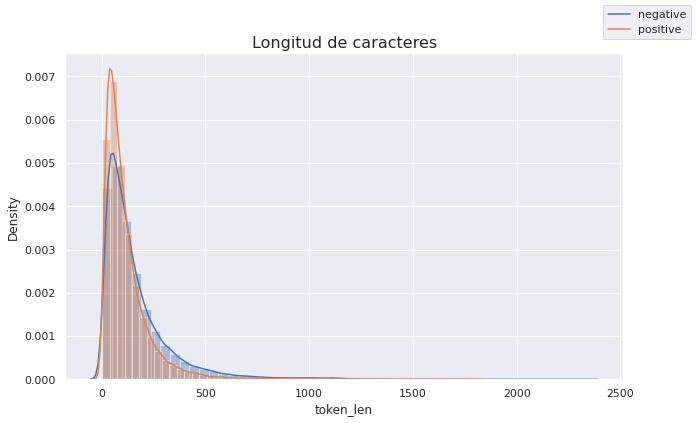

In [54]:
fig = plt.figure(figsize=(10,6))
plt1 = sns.distplot(df_sample[df_sample['positive'] == 0]["token_len"], hist=True, label="negative")
plt2 = sns.distplot(df_sample[df_sample['positive'] == 1]["token_len"], hist=True, label="positive")
fig.legend(labels=['negative','positive'])
plt.title("Longitud de caracteres", fontsize = 16)
plt.show()

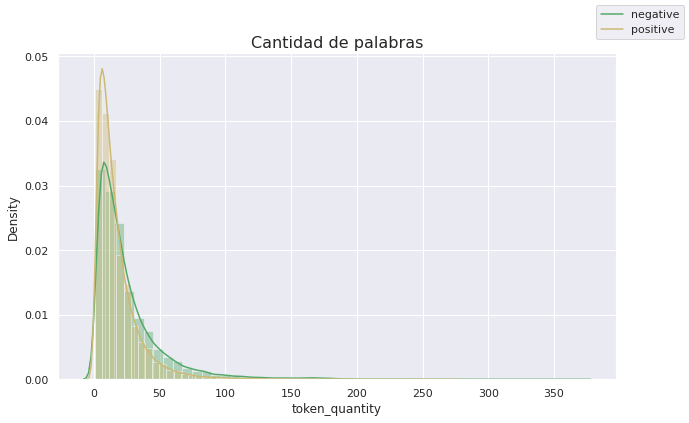

In [55]:

fig = plt.figure(figsize=(10,6))
plt1 = sns.distplot(df_sample[df_sample['positive'] == 0]["token_quantity"], hist=True, label="negative", color="g")
plt2 = sns.distplot(df_sample[df_sample['positive'] == 1]["token_quantity"], hist=True, label="positive", color="y")
fig.legend(labels=['negative','positive'])
plt.title("Cantidad de palabras", fontsize = 16)
plt.show()

In [57]:
positive = df_sample["clean_reviews"][df_sample.positive == 1]
negative = df_sample["clean_reviews"][df_sample.positive == 0]

In [58]:
def frecuencia_tokens(lista): 
    frecuencia = {} 
    for item in lista: 
        if (item in frecuencia): 
            frecuencia[item] += 1
        else: 
            frecuencia[item] = 1
    return frecuencia

lista_tokens_pos = list()
for i in positive:
  tokens_document = word_tokenize(i)

  lista_tokens_pos.extend(tokens_document)

dict_freq_pos = frecuencia_tokens(lista_tokens_pos)

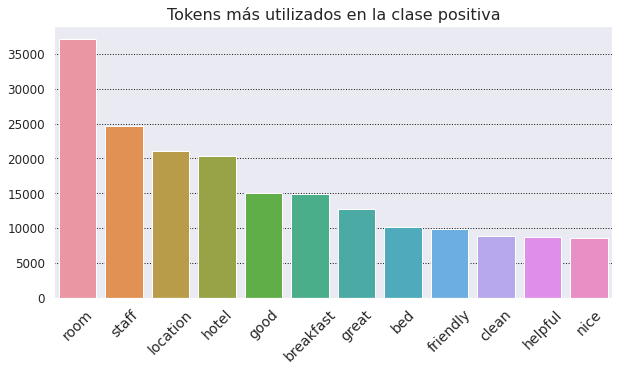

In [59]:
dict_freq_order = sorted(dict_freq_pos.items(), key=lambda x: x[1], reverse=True)
token_names_pos = list()
token_freqs_pos = list()
for i in dict_freq_order:
  if i[1] > 8000:
    token_names_pos.append(i[0])
    token_freqs_pos.append(i[1])

plt.rcParams['figure.figsize'] = [10, 5]
sns_g = sns.barplot(x=token_names_pos, y=token_freqs_pos)
plt.xticks(rotation=45,fontsize=14)
plt.yticks(fontsize=12)
plt.grid(True, color ='k', axis = 'y', linestyle=':')
plt.title("Tokens más utilizados en la clase positiva", fontsize=16)
plt.show()

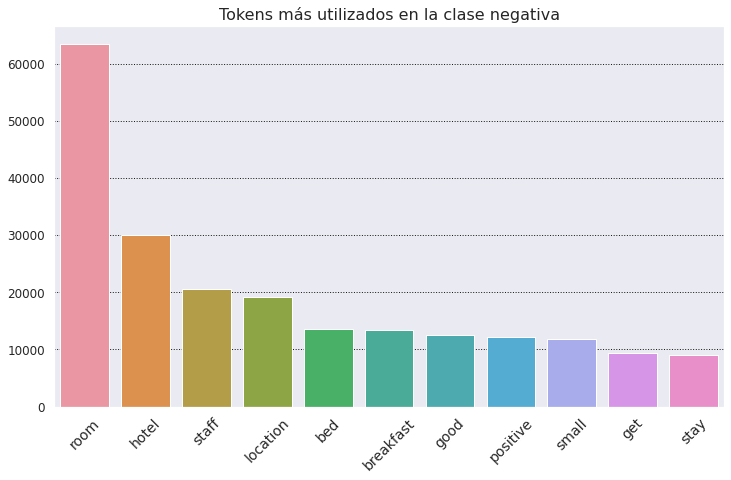

In [60]:
lista_tokens_neg = list()
for i in negative:
  tokens_document = word_tokenize(i)
  lista_tokens_neg.extend(tokens_document)

dict_freq_neg = frecuencia_tokens(lista_tokens_neg)

dict_freq_order_neg = sorted(dict_freq_neg.items(), key=lambda x: x[1], reverse=True)
token_names_neg = list()
token_freqs_neg = list()
for i in dict_freq_order_neg:
  if i[1] > 9000:
    token_names_neg.append(i[0])
    token_freqs_neg.append(i[1])

plt.rcParams['figure.figsize'] = [12, 7]
sns_g = sns.barplot(x=token_names_neg, y=token_freqs_neg)
plt.xticks(rotation=45,fontsize=14)
plt.yticks(fontsize=12)
plt.grid(True, color ='k', axis = 'y', linestyle=':')
plt.title("Tokens más utilizados en la clase negativa", fontsize=16)
plt.show()

In [61]:
#create n-gramas
def find_ngrams(input_list, n):
    return list(zip(*[input_list[i:] for i in range(n)]))

#df_sample['bigrams'] = df_sample['clean_reviews'].apply(lambda row: list(nltk.bigrams(row.split(' '))))
df_sample['bigrams'] = df_sample['clean_reviews'].map(lambda x: find_ngrams(x.split(" "), 2))
df_sample['trigrams'] = df_sample['clean_reviews'].map(lambda x: find_ngrams(x.split(" "), 3))
df_sample.head()

,all_reviews,positive,Reviewer_Score,Hotel_Name,clean_reviews,token_len,token_quantity,bigrams,trigrams
0,I am so angry that i made this post available ...,0,2.9,Hotel Arena,angry make post available via possible site us...,1024,173,"[(angry, make), (make, post), (post, available...","[(angry, make, post), (make, post, available),..."
3,My room was dirty and I was afraid to walk bar...,0,3.8,Hotel Arena,room dirty afraid walk barefoot floor look cle...,774,119,"[(room, dirty), (dirty, afraid), (afraid, walk...","[(room, dirty, afraid), (dirty, afraid, walk),..."
6,Cleaner did not change our sheet and duvet eve...,0,4.6,Hotel Arena,clean change sheet duvet everyday make bed als...,134,22,"[(clean, change), (change, sheet), (sheet, duv...","[(clean, change, sheet), (change, sheet, duvet..."
11,6 30 AM started big noise workers loading wood...,0,5.8,Hotel Arena,start big noise worker load wood window stupid...,309,48,"[(start, big), (big, noise), (noise, worker), ...","[(start, big, noise), (big, noise, worker), (n..."
12,The floor in my room was filfy dirty Very basi...,0,4.6,Hotel Arena,floor room filfy dirty basic room old tv room ...,101,17,"[(floor, room), (room, filfy), (filfy, dirty),...","[(floor, room, filfy), (room, filfy, dirty), (..."


In [62]:
#bigramas 
bigrams_positive = df_sample[df_sample.positive == 1]['bigrams'].tolist()
bigrams_positive = list(chain(*bigrams_positive))
bigram_positive_counts = Counter(bigrams_positive)
bigram_positive_counts.most_common(10)


[(('great', 'location'), 3441),
 (('friendly', 'staff'), 2816),
 (('staff', 'friendly'), 2814),
 (('friendly', 'helpful'), 2375),
 (('good', 'location'), 2185),
 (('helpful', 'staff'), 1933),
 (('staff', 'helpful'), 1896),
 (('room', 'clean'), 1623),
 (('room', 'small'), 1372),
 (('excellent', 'location'), 1345)]

In [63]:
# bigramas negativas
bigrams_negative = df_sample[df_sample.positive == 0]['bigrams'].tolist()
bigrams_negative = list(chain(*bigrams_negative))
bigram_negative_counts = Counter(bigrams_negative)
bigram_negative_counts.most_common(10)

[(('room', 'small'), 3567),
 (('star', 'hotel'), 2472),
 (('small', 'room'), 2320),
 (('good', 'location'), 2003),
 (('location', 'good'), 1997),
 (('room', 'service'), 1840),
 (('room', 'clean'), 1735),
 (('book', 'com'), 1720),
 (('staff', 'friendly'), 1627),
 (('air', 'conditioning'), 1222)]

In [64]:
# trigramas positivas
trigrams_positive = df_sample[df_sample.positive == 1]['trigrams'].tolist()
trigrams_positive = list(chain(*trigrams_positive))
trigram_positive_counts = Counter(trigrams_positive)
trigram_positive_counts.most_common(10)

[(('staff', 'friendly', 'helpful'), 1079),
 (('friendly', 'helpful', 'staff'), 760),
 (('location', 'friendly', 'staff'), 416),
 (('good', 'value', 'money'), 327),
 (('staff', 'helpful', 'friendly'), 322),
 (('hotel', 'great', 'location'), 304),
 (('within', 'walk', 'distance'), 250),
 (('staff', 'great', 'location'), 243),
 (('would', 'definitely', 'stay'), 236),
 (('room', 'clean', 'comfortable'), 210)]

In [65]:
# trigramas negativas
trigrams_negative = df_sample[df_sample.positive == 0]['trigrams'].tolist()
trigrams_negative = list(chain(*trigrams_negative))
trigrams_negative_counts = Counter(trigrams_negative)
trigrams_negative_counts.most_common(10)

[(('staff', 'friendly', 'helpful'), 283),
 (('four', 'star', 'hotel'), 278),
 (('front', 'desk', 'staff'), 256),
 (('two', 'single', 'bed'), 215),
 (('room', 'extremely', 'small'), 206),
 (('air', 'conditioning', 'work'), 202),
 (('poor', 'value', 'money'), 180),
 (('book', 'book', 'com'), 156),
 (('air', 'con', 'work'), 152),
 (('do', 'not', 'work'), 150)]

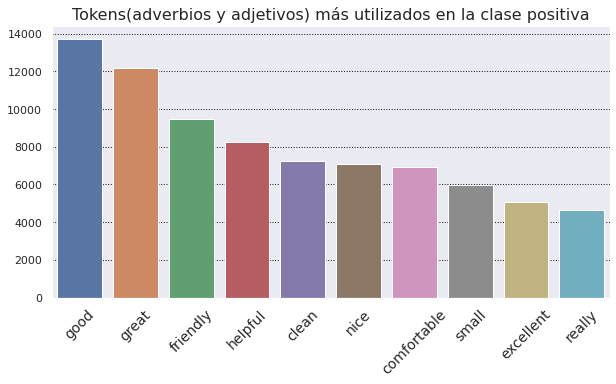

In [66]:
def filtra_tags(textos, tags_permitidas=['NOUN', 'ADJ', 'VERB', 'ADV']):
    textos_out = []
    for sent in textos:
        # Juntar los "bigrams"
        doc = nlp(sent) 
        # Filtra por etiqueta
        textos_out.append([token.text for token in doc if token.pos_ in tags_permitidas])
    return textos_out

data_pos = filtra_tags(positive, tags_permitidas=['ADJ','ADV'])
data_pos_flat_list = [item for sublist in data_pos for item in sublist]

lista_tokens_pos = list()
for i in data_pos_flat_list:
  tokens_document = word_tokenize(i)
  lista_tokens_pos.extend(tokens_document)
    
dict_freq_pos = frecuencia_tokens(lista_tokens_pos)

dict_freq_order = sorted(dict_freq_pos.items(), key=lambda x: x[1], reverse=True)
token_names_pos1 = list()
token_freqs_pos1 = list()
for i in dict_freq_order:
  if i[1] > 4000:
    token_names_pos1.append(i[0])
    token_freqs_pos1.append(i[1])

plt.rcParams['figure.figsize'] = [10, 5]
sns_g = sns.barplot(x=token_names_pos1, y=token_freqs_pos1)
plt.xticks(rotation=45,fontsize=14)
plt.grid(True, color ='k', axis = 'y', linestyle=':')
plt.title("Tokens(adverbios y adjetivos) más utilizados en la clase positiva", fontsize=16)
plt.show()

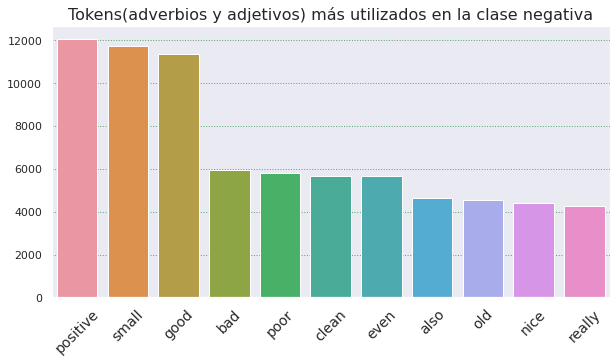

In [67]:
data_neg = filtra_tags(negative, tags_permitidas=['ADJ','ADV'])
data_neg_flat_list = [item for sublist in data_neg for item in sublist]

lista_tokens_neg = list()
for i in data_neg_flat_list:
  tokens_document = word_tokenize(i)
  lista_tokens_neg.extend(tokens_document)

dict_freq_neg = frecuencia_tokens(lista_tokens_neg)

dict_freq_order = sorted(dict_freq_neg.items(), key=lambda x: x[1], reverse=True)
token_names_neg1 = list()
token_freqs_neg1 = list()
for i in dict_freq_order:
  if i[1] > 4000:
    token_names_neg1.append(i[0])
    token_freqs_neg1.append(i[1])

plt.rcParams['figure.figsize'] = [10, 5]
sns_g = sns.barplot(x=token_names_neg1, y=token_freqs_neg1)
plt.xticks(rotation=45,fontsize=14)
plt.grid(True, color ='g', axis = 'y', linestyle=':')
plt.title("Tokens(adverbios y adjetivos) más utilizados en la clase negativa", fontsize=16)
plt.show()


#### WORDCLOUD

Positive reviews


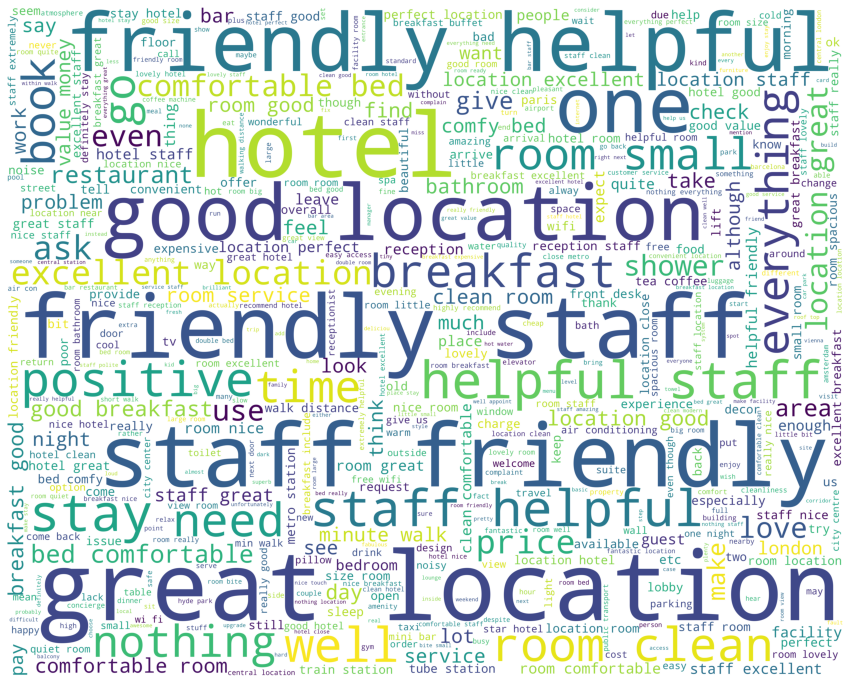

Negative reviews


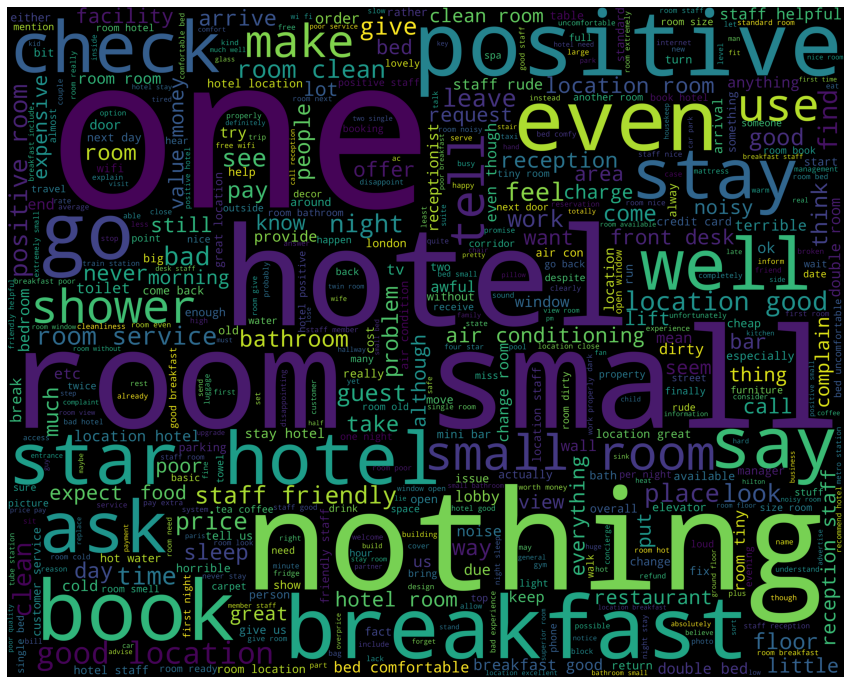

In [68]:
# Usamos wordcloud para representar visualmente los datos de texto
def wordcloud_draw(data, color = 'black'):
    words = ' '.join(data)
    wordcloud = WordCloud(background_color=color,
                      width=2500,
                      height=2000,
                      max_words=500, 
                      contour_width=0, 
                      contour_color='steelblue', 
                      scale =3).generate(words)
    plt.figure(1, figsize = (15, 15))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
    
print("Positive reviews")
wordcloud_draw(positive,'white')
print("Negative reviews")
wordcloud_draw(negative)

### 2.1.4 Analysis

In [69]:
df_sample['sentiment_polarity'] = df_sample['all_reviews'].apply(lambda x: TextBlob(x).sentiment.polarity)
df_sample['sentiment_subjectivity'] = df_sample['all_reviews'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
df_sample.head()

,all_reviews,positive,Reviewer_Score,Hotel_Name,clean_reviews,token_len,token_quantity,bigrams,trigrams,sentiment_polarity,sentiment_subjectivity
0,I am so angry that i made this post available ...,0,2.9,Hotel Arena,angry make post available via possible site us...,1024,173,"[(angry, make), (make, post), (post, available...","[(angry, make, post), (make, post, available),...",0.046438,0.452243
3,My room was dirty and I was afraid to walk bar...,0,3.8,Hotel Arena,room dirty afraid walk barefoot floor look cle...,774,119,"[(room, dirty), (dirty, afraid), (afraid, walk...","[(room, dirty, afraid), (dirty, afraid, walk),...",0.019355,0.579570
6,Cleaner did not change our sheet and duvet eve...,0,4.6,Hotel Arena,clean change sheet duvet everyday make bed als...,134,22,"[(clean, change), (change, sheet), (sheet, duv...","[(clean, change, sheet), (change, sheet, duvet...",0.343333,0.686667
11,6 30 AM started big noise workers loading wood...,0,5.8,Hotel Arena,start big noise worker load wood window stupid...,309,48,"[(start, big), (big, noise), (noise, worker), ...","[(start, big, noise), (big, noise, worker), (n...",-0.200694,0.723611
12,The floor in my room was filfy dirty Very basi...,0,4.6,Hotel Arena,floor room filfy dirty basic room old tv room ...,101,17,"[(floor, room), (room, filfy), (filfy, dirty),...","[(floor, room, filfy), (room, filfy, dirty), (...",0.050000,0.440625


In [70]:
print(df_sample['all_reviews'][3043])
print("sentiment polarity:"  + str(df_sample['sentiment_polarity'][3043]))
print("sentiment_subjectivity:" + str(df_sample['sentiment_subjectivity'][3043]))
print("Reviewer_Score:" + str(df_sample['Reviewer_Score'][3043]))

print('--------------------------------')
print(df_sample['all_reviews'][299])
print("sentiment polarity:"  + str(df_sample['sentiment_polarity'][299]))
print("sentiment_subjectivity:" + str(df_sample['sentiment_subjectivity'][299]))
print("Reviewer_Score:" + str(df_sample['Reviewer_Score'][299]))

Staff are rude Rooms are awful Location is awful Hotel is awful MUCH BETTER HOTELS AROUND THEN THIS Nothing
sentiment polarity:-0.5599999999999999
sentiment_subjectivity:0.82
Reviewer_Score:2.5
--------------------------------
Renovations taking place which were not communicated foul smell outside our room things left from previous guest Nothing in particular stood out
sentiment polarity:0.0
sentiment_subjectivity:0.1375
Reviewer_Score:4.6


In [ ]:
df_sample[df_sample["token_quantity"] >= 5].sort_values("sentiment_polarity", ascending = False)[["clean_reviews", "Reviewer_Score","sentiment_polarity"]].head(10)

,clean_reviews,Reviewer_Score,sentiment_polarity
100316,location excellent breakfast excellent staff h...,10.0,1.0
192450,excellent hotel spacious room superb facility,9.6,1.0
381174,facility location excellent breakfast delicious,10.0,1.0
472117,hospitality perfect location kithen possibilit...,10.0,1.0
458915,nothing dislije excellent every area,10.0,1.0
199533,breakfast superb get wifi iphone,9.2,1.0
10967,nothing hotel location lobby room staff faultless,10.0,1.0
430206,wonderful location wonderful staff heart vienna,10.0,1.0
168635,nothing excellent breakfast delicious although...,9.6,1.0
261799,travel group friend perfect hotel,10.0,1.0


In [72]:
df_sample[df_sample["token_quantity"] >= 5].sort_values("sentiment_polarity", ascending = False)[["clean_reviews", "Reviewer_Score","sentiment_polarity"]].tail(10)

,clean_reviews,Reviewer_Score,sentiment_polarity
35174,staff clueless bad stay ever hotel,3.8,-1.0
106673,breakfast internet elevator terrible internet,3.8,-1.0
489982,everything bad stay ever nothing,3.3,-1.0
430795,breakfast horrible restaurant rebuild place se...,5.8,-1.0
52211,reservation treat like fraudster wait min coul...,5.4,-1.0
105020,staff horrible know solve manage problem nothing,3.8,-1.0
367941,hotel zero facility staff must train course mi...,5.4,-1.0
205320,room horrific rip carpet stain grubby bathroom...,2.9,-1.0
384598,plastic cover bed remove cover sleep horrible ...,6.3,-1.0
461794,bed awful rip cost hotel get per night book co...,2.5,-1.0


In [73]:
df_sample[df_sample["token_quantity"] >= 5].sort_values("sentiment_polarity", ascending = False)[["clean_reviews", "Reviewer_Score","sentiment_polarity"]].head(10)

,clean_reviews,Reviewer_Score,sentiment_polarity
100316,location excellent breakfast excellent staff h...,10.0,1.0
192450,excellent hotel spacious room superb facility,9.6,1.0
381174,facility location excellent breakfast delicious,10.0,1.0
472117,hospitality perfect location kithen possibilit...,10.0,1.0
458915,nothing dislije excellent every area,10.0,1.0
199533,breakfast superb get wifi iphone,9.2,1.0
10967,nothing hotel location lobby room staff faultless,10.0,1.0
430206,wonderful location wonderful staff heart vienna,10.0,1.0
168635,nothing excellent breakfast delicious although...,9.6,1.0
261799,travel group friend perfect hotel,10.0,1.0


Text(0.5, 1.0, 'Polaridad y subjetividad de texto')

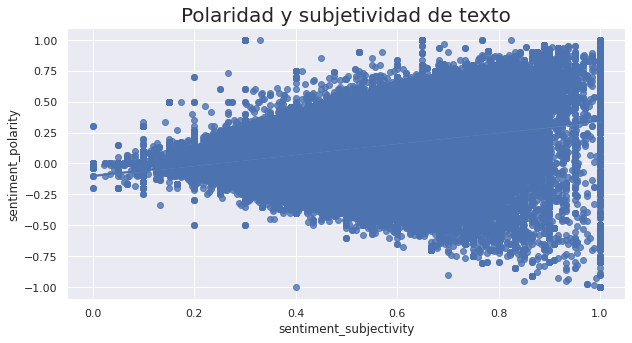

In [74]:
sns.regplot(y = "sentiment_polarity", x = "sentiment_subjectivity", data=df_sample)
plt.title("Polaridad y subjetividad de texto", fontsize = 20)

### 2.1.5 Vectorization

In [75]:
# BoW Features
vectorizador = TfidfVectorizer(min_df=0.02, ngram_range=(1,3), max_features=300, lowercase=False)
vector_data = vectorizador.fit_transform(df_sample["clean_reviews"])
vector_data

<104774x207 sparse matrix of type '<class 'numpy.float64'>'
	with 1139010 stored elements in Compressed Sparse Row format>

In [76]:
vector_data_voc = vectorizador.fit(df_sample["clean_reviews"])
vector_data_voc.vocabulary_

{'make': 99,
 'available': 8,
 'use': 191,
 'one': 120,
 'book': 19,
 'place': 129,
 'stay': 170,
 'night': 113,
 'hotel': 81,
 'small': 158,
 'room': 145,
 'floor': 61,
 'would': 206,
 'big': 17,
 'window': 203,
 'high': 79,
 'ok': 118,
 'close': 29,
 'smell': 160,
 'ask': 7,
 'change': 24,
 'time': 179,
 'double': 42,
 'get': 68,
 'way': 199,
 'offer': 117,
 'next': 111,
 'day': 36,
 'check': 26,
 'good': 71,
 'wait': 194,
 'want': 197,
 'view': 193,
 'city': 27,
 'noise': 114,
 'tube': 185,
 'even': 47,
 'come': 32,
 'leave': 87,
 'seem': 152,
 'park': 123,
 'outside': 122,
 'small room': 159,
 'dirty': 39,
 'walk': 195,
 'look': 96,
 'clean': 28,
 'nice': 112,
 'door': 41,
 'like': 90,
 'shower': 154,
 'staff': 163,
 'request': 142,
 'bed': 15,
 'could': 35,
 'also': 1,
 'see': 151,
 'early': 44,
 'water': 198,
 'keep': 84,
 'noisy': 115,
 'many': 100,
 'guest': 75,
 'old': 119,
 'price': 133,
 'move': 106,
 'around': 5,
 'sleep': 157,
 'great': 73,
 'location': 92,
 'bar': 12,
 'r

## 2.1.6 Construction of model

In [77]:
extra_features = df_sample[["sentiment_polarity", "sentiment_subjectivity"]]

y = df_sample["positive"].values.astype(np.float32) 


X = sp.sparse.hstack((vector_data,extra_features.values),format='csr')

In [79]:
X_columns=vectorizador.get_feature_names()+extra_features.columns.tolist()
X_columns

['air',
 'also',
 'amazing',
 'another',
 'area',
 'around',
 'arrive',
 'ask',
 'available',
 'away',
 'back',
 'bad',
 'bar',
 'bath',
 'bathroom',
 'bed',
 'bedroom',
 'big',
 'bit',
 'book',
 'breakfast',
 'call',
 'carpet',
 'central',
 'change',
 'charge',
 'check',
 'city',
 'clean',
 'close',
 'coffee',
 'cold',
 'come',
 'comfortable',
 'comfy',
 'could',
 'day',
 'definitely',
 'desk',
 'dirty',
 'do',
 'door',
 'double',
 'drink',
 'early',
 'easy',
 'enough',
 'even',
 'every',
 'everything',
 'excellent',
 'expect',
 'expensive',
 'experience',
 'extra',
 'extremely',
 'facility',
 'far',
 'feel',
 'find',
 'first',
 'floor',
 'food',
 'free',
 'friendly',
 'friendly helpful',
 'friendly staff',
 'front',
 'get',
 'give',
 'go',
 'good',
 'good location',
 'great',
 'great location',
 'guest',
 'help',
 'helpful',
 'helpful staff',
 'high',
 'hot',
 'hotel',
 'hour',
 'include',
 'keep',
 'know',
 'large',
 'leave',
 'lift',
 'light',
 'like',
 'little',
 'location',
 'loc

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
print(X_train.shape)
print(X_test.shape)

(78580, 209)
(26194, 209)


**Model Logistic Regression**

In [81]:
model_log=LogisticRegression()
model_log.fit(X_train,y_train)
model_log.score(X_test, y_test)

0.8037336794685805

**Model Naive Bayes**

In [82]:
naive_bayes = GaussianNB()
naive_bayes.fit(X_train.toarray(),y_train) 
naive_bayes.score(X_test.toarray(), y_test) 

0.7629228067496373

**Model Decision tree classification**

In [83]:
tree=DecisionTreeClassifier(random_state=0)
tree.fit(X_train,y_train)
tree.score(X_test, y_test)

0.7331831717187142

**Model Random Forest classification**

In [84]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.8051080400091624

In [85]:
def saca_metricas(y1, y2):
    print('Xonfusión Matrix')
    print(confusion_matrix(y1, y2))
    print('Accuracy')
    print(accuracy_score(y1, y2))
    print('Precision')
    print(precision_score(y1, y2))
    print('Recall')
    print(recall_score(y1, y2))
    print('F1')
    print(f1_score(y1, y2))

y_pred = rf.predict(X_test)
print(saca_metricas(y_test,y_pred))

Matriz de confusión
[[10785  2299]
 [ 2806 10304]]
Accuracy
0.8051080400091624
Precision
0.817583115131318
Recall
0.7859649122807018
F1
0.8014622953369891
None


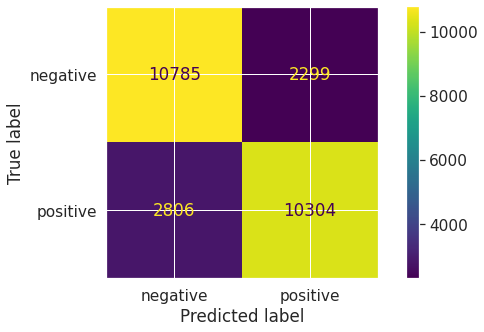

In [86]:
sns.set(font_scale=1.4) 
class_names = ['negative', 'positive']
plot_confusion_matrix(rf, X_test, y_test, normalize = None,values_format = '.0f', display_labels=class_names)

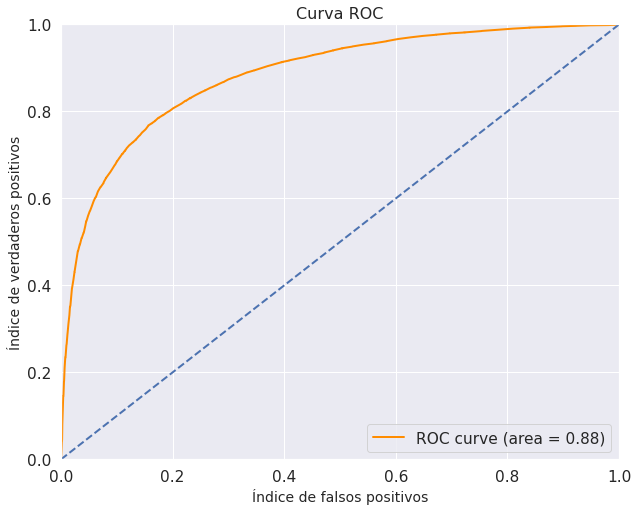

In [87]:

y_pred = [x[1] for x in rf.predict_proba(X_test)]
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label = 1)

roc_auc = auc(fpr, tpr)

plt.figure(1, figsize = (10, 8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('Índice de falsos positivos',fontsize = 14)
plt.ylabel('Índice de verdaderos positivos', fontsize = 14)
plt.title('Curva ROC', fontsize = 16)
plt.legend(loc="lower right")
plt.show()

In [88]:
roc_auc

0.8835665415815801

In [89]:
importance = rf.feature_importances_

<AxesSubplot:>

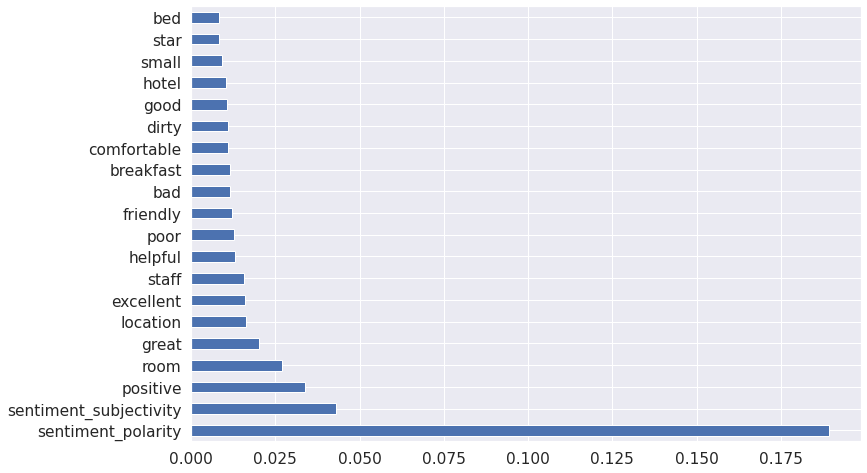

In [90]:
(pd.Series(importance, index=X_columns).nlargest(20).plot(kind='barh', figsize= (12,8))) 


In [91]:
txt_data = df_sample["all_reviews"]


data_words = list()
for i in df_sample["clean_reviews"].to_list():
  data_words.append(tokenizar(i))



In [92]:

bigram = gensim.models.Phrases(data_words, min_count=2, threshold=100) 
bigram_tokens = [bigram[data_words[w]] for w in range(len(data_words))]

In [93]:
model = Word2Vec(bigram_tokens, vector_size=300, min_count=1, workers=3, window=5, sg=1)

In [94]:
def get_feat(x):
    arr = []
    for i in x:
        arr.append(model.wv[i])
    
    arr = list(np.mean(arr, axis=0))
    return arr

XX = pd.Series(bigram_tokens).apply(lambda x: get_feat(x))
XX = np.array(list(XX))
XX = XX/XX.max(axis=0)

#scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
XX = scaler.fit_transform(XX)

In [95]:
from plotly.subplots import make_subplots
import plotly.graph_objs as go
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
for k in K: 
    kmeanModel = KMeans(n_clusters=k).fit(XX) 
    kmeanModel.fit(XX)     
      
    distortions.append(sum(np.min(cdist(XX, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / XX.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(XX, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / XX.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 


df_elbow = pd.DataFrame(list(zip(K, distortions, inertias)), columns=["K","Distortions","Inertia"])


fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    go.Scatter(x=df_elbow["K"], y=df_elbow["Distortions"], name="Distortion"),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=df_elbow["K"], y=df_elbow["Inertia"], name="Inertia"),
    row=1, col=2
)
fig.update_layout(template="plotly",title="Elbow method - Distortions and Inertia", xaxis_title="K", xaxis2_title="K")

In [96]:

kmeans = KMeans(n_clusters=3, random_state=0).fit(XX)
centers = kmeans.labels_
df_XX  = pd.DataFrame(XX)
df_XX["clusters"] = list(centers)

df_concat = pd.concat([txt_data.reset_index(),pd.Series(bigram_tokens,name="bigram_tokens_clean"),df_XX],axis=1).set_index('index')
df_concat = df_concat.join(df_sample["Hotel_Name"])

In [97]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_concat[np.arange(0,100)])
df_concat['PC1'] = X_pca[:,0]
df_concat['PC2'] = X_pca[:,1]

fig = px.scatter(df_concat, x="PC1", y="PC2", color="clusters",
                 size=len('bigram_tokens_clean'), hover_data=['Hotel_Name'])

fig.show()

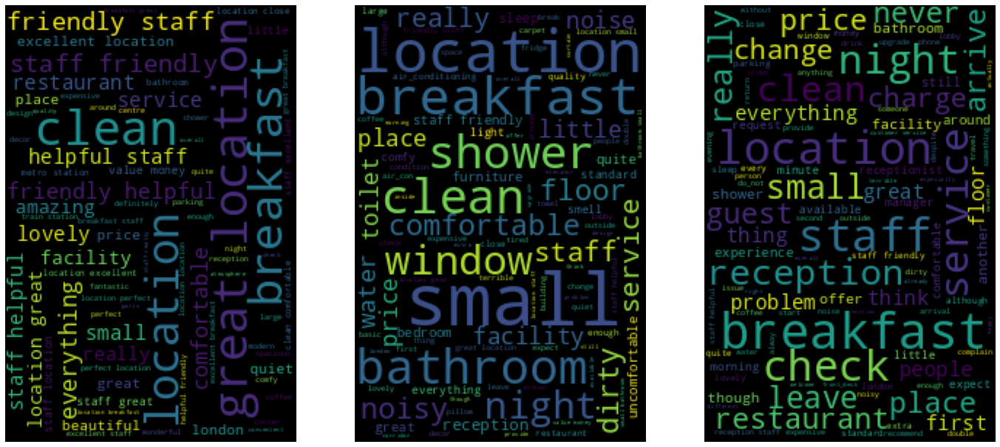

In [98]:
 

def clust_words(cluster_num):
    lst = list(df_concat[df_concat["clusters"]==cluster_num]["bigram_tokens_clean"])
    reviews = ""
    for i in lst:
        for t in i:
            if len(t) >= 5:
                reviews += " " + t + " "

    reviews = reviews.strip()
    return reviews


length = len(df_concat["clusters"].unique())
stopwords = set(STOPWORDS)
stopwords.add('hotel')
stopwords.add('nothing')
stopwords.add('positive')
wrdcld = WordCloud(width = 200, height =300, 
                background_color ='black', 
                stopwords = stopwords, 
                min_font_size = 4,
                max_words=2000)

fig, ax = plt.subplots(1,length,figsize = (24,20))

for i in range(length):
    reviews = clust_words(i)
    wordcloud = wrdcld.generate(reviews)
    ax[i].imshow(wordcloud) 
    ax[i].axis("off") 

plt.show();

## 2.3 Topic modelling

In [99]:
data_words = list()
for i in df_sample["clean_reviews"].to_list():
  data_words.append(tokenizar(i))

bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) 
bigram_mod = gensim.models.phrases.Phraser(bigram)

In [100]:
bigram_mod[data_words[10]]

['hotel',
 'construction',
 'never',
 'mention',
 'book',
 'point',
 'arrive',
 'wander',
 'around',
 'empty',
 'half',
 'finish',
 'corridor',
 'look',
 'temporary',
 'lobby',
 'room',
 'nice',
 'bathroom',
 'glass',
 'box',
 'inside',
 'bedroom',
 'anyway',
 'private',
 'showering',
 'use',
 'toilet',
 'feel',
 'aptly',
 'like',
 'perform',
 'kinky',
 'amsterdam',
 'window',
 'also',
 'nail',
 'stick',
 'entrance',
 'glass',
 'bathroom',
 'first',
 'discover',
 'barefoot',
 'wake',
 'sound',
 'scaffolding',
 'hammer',
 'together',
 'someone',
 'drilling',
 'concrete',
 'hardly',
 'relax',
 'break',
 'noisey',
 'london',
 'believe',
 'book',
 'pictures',
 'hotel',
 'look',
 'park',
 'yet',
 'room',
 'look',
 'empty',
 'courtyard',
 'scatter',
 'random',
 'bit',
 'scaffold',
 'debris',
 'first',
 'floor',
 'corridor',
 'smell',
 'like',
 'serious',
 'blocked',
 'plumbing',
 'issue',
 'perhaps',
 'another',
 'guest',
 'unwell',
 'breakfast',
 'really',
 'lazily',
 'throw',
 'together',


In [101]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

def make_bigrams(textos):
    return [bigram_mod[doc] for doc in textos]

def filtra_tags(textos, tags_permitidas=['NOUN', 'ADJ', 'VERB', 'ADV']):
    textos_out = []
    for sent in textos:
        doc = nlp(" ".join(sent)) 
        textos_out.append([token.text for token in doc if token.pos_ in tags_permitidas])
    return textos_out

data_words_bigrams = make_bigrams(data_words)

nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])
data_pos = filtra_tags(data_words_bigrams, tags_permitidas=['NOUN', 'ADJ', 'ADV'])

In [103]:
id2word = corpora.Dictionary(data_pos)
print(id2word)

texts = data_pos
corpus = [id2word.doc2bow(text) for text in texts]
print(corpus[2])

Dictionary(22150 unique tokens: ['able', 'angry', 'annoying', 'attach', 'audio']...)
[(6, 1), (12, 1), (28, 1), (38, 1), (53, 1), (61, 1), (89, 1), (95, 1), (99, 1), (138, 1), (148, 1), (149, 1), (150, 1), (151, 1), (152, 1), (153, 1), (154, 1), (155, 1), (156, 1)]


In [104]:
def calculo_valor_coherencia(corpus, dictionary, k, a, b):
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_pos, dictionary=dictionary, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [107]:
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                      id2word=id2word,
                                      num_topics=4, 
                                      random_state=100,
                                      chunksize=100,
                                      passes=10,
                                      alpha=0.01,
                                      eta=0.9)

In [108]:
print(lda_model.print_topics())


[(0, '0.045*"close" + 0.042*"station" + 0.031*"walk" + 0.025*"hotel" + 0.022*"easy" + 0.020*"minute" + 0.018*"location" + 0.018*"restaurant" + 0.016*"tube" + 0.016*"train"'), (1, '0.088*"room" + 0.027*"bed" + 0.018*"small" + 0.017*"location" + 0.017*"good" + 0.015*"bathroom" + 0.013*"breakfast" + 0.012*"positive" + 0.011*"shower" + 0.011*"comfortable"'), (2, '0.068*"staff" + 0.058*"room" + 0.048*"location" + 0.035*"great" + 0.034*"good" + 0.034*"breakfast" + 0.033*"hotel" + 0.032*"friendly" + 0.027*"helpful" + 0.019*"clean"'), (3, '0.034*"hotel" + 0.029*"room" + 0.019*"staff" + 0.016*"time" + 0.015*"book" + 0.013*"day" + 0.013*"check" + 0.010*"night" + 0.010*"service" + 0.009*"reception"')]


In [109]:
lda_model.get_document_topics(corpus[8])

[(0, 0.12998378), (1, 0.55624336), (3, 0.31357238)]

In [110]:
lda_model.get_term_topics("shower", minimum_probability=0.0001) 

[(1, 0.0111884605)]

In [111]:
txt_data = df_sample["all_reviews"]

arr = []
for i, j in enumerate(lda_model[corpus]):
    if len(j) > 0:
        max_val = sorted([w[1] for w in j],reverse=True)[0]
        max_topic = [w[0] for w in j if w[1]==max_val][0]
        keywords = lda_model.show_topic(max_topic,topn=4)
        keywords = [k[0] for k in keywords]
        description = txt_data.iloc[i]
        arr.append([description,  ",".join(keywords), max_topic, round(max_val,2),])

lda_distribution = pd.DataFrame(arr, columns=['Description', 'Top Keywords', 'Dominant Topic', 'Probability'])
lda_distribution.head()

,Description,Top Keywords,Dominant Topic,Probability
0,I am so angry that i made this post available ...,"hotel,room,staff,time",3,0.57
1,My room was dirty and I was afraid to walk bar...,"room,bed,small,location",1,0.61
2,Cleaner did not change our sheet and duvet eve...,"room,bed,small,location",1,0.86
3,6 30 AM started big noise workers loading wood...,"hotel,room,staff,time",3,0.64
4,The floor in my room was filfy dirty Very basi...,"room,bed,small,location",1,1.00


In [112]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.108649  0.023525       1        1  35.484996
3      0.060313 -0.181238       2        1  31.144597
2      0.125312  0.130571       3        1  26.709796
0     -0.294274  0.027142       4        1   6.660611, topic_info=           Term          Freq         Total Category  logprob  loglift
166       staff  37914.000000  37914.000000  Default  30.0000  30.0000
222    friendly  13103.000000  13103.000000  Default  29.0000  29.0000
16        close   6475.000000   6475.000000  Default  28.0000  28.0000
118    location  31544.000000  31544.000000  Default  27.0000  27.0000
728     helpful  11966.000000  11966.000000  Default  26.0000  26.0000
..          ...           ...           ...      ...      ...      ...
118    location   1854.441029  31544.558293   Topic4  -3.9955  -0.1249
940  convenient    663.817705   1677.061604   Topic4  -5.0229   1.7822
110       great    853.587596  18712.473197   Topic4  -4.7714  -0.3785
32         good    861.598000  25467.089968   Topic4  -4.7621  -0.6774
48         next    711.338095   4535.069360   Topic4  -4.9537   0.8565

[281 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
515       1  0.281645         access
515       2  0.222066         access
515       3  0.001625         access
515       4  0.495045         access
1247      1  0.039499  accommodating
...     ...       ...            ...
179       4  0.000308           work
913       1  0.103026           year
913       2  0.895284           year
913       3  0.001304           year
913       4  0.000652           year

[880 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 3, 1])